In [3]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


# Abstract:
- The study works on generating CT images from MRI images, where unsupervised learning was used using VAE-CycleGan.
Since the number of samples included in the data set used in the study, and therefore in this case we are in a state of epistemic uncertainty, therefore probabilistic models were used in forming the latent space.
- The current study is a continuation of the study ([Multi-Scale CycleGAN Night to Day](https://github.com/kaledhoshme123/Multi-Scale-CycleGAN-Night-to-Day)), but the difference between them is that in the study we were in the same field but working on generating the same scene at night or during the day, but the current study works on moving from one probability distribution to another probability distribution (i.e. studying the transition from one probability distribution to another probability distribution Another) and thus several properties included in the neural network were removed in the study ([Multi-Scale CycleGAN Night to Day](https://github.com/kaledhoshme123/Multi-Scale-CycleGAN-Night-to-Day)).
- The shaping of the latent space was adjusted by making the probability distributions of the latent space as close as possible to the standard Gaussian normal distribution.
The problem facing the research: What features does the discriminator look for to identify CT and MRI images? The same discriminator structure was used in the study ([Multi-Scale CycleGAN Night to Day](https://github.com/kaledhoshme123/Multi-Scale-CycleGAN-Night-to-Day)), but with the addition of a deeper discriminator structure (to extract more important features), and at the same time Time adjusts the features extracted from previous convolutional layers to fit the last convolutional layer in the discriminator structure.
- The derivative independence methodology used in the discriminator (which works to adjust the features that are extracted from the convolutional layers in the previous convolutional layers depending on the output of the last convolutional layer and at the same time examines the features extracted from the previous convolutional layers as real or fake (that is, the neural network in this The case is forced to adjust its weights in the previous convolutional layers so that they are real and not fake, and at the same time they must be appropriate to the output of the last convolutional layer - this helps the discriminator to have a deep understanding of the features that should be focused.
- By distinguishing between real and fake images, it helps in arriving at an accurate generating result.
- The study achieved good results when transitioning from MRI images to CT images, and acceptable results when transitioning from CT images to MRI images (the reason for this is the ease of transitioning from MRI images to CT images and its difficulty in the opposite direction. As well as the small number of samples included dataset).
- I trained the proposed model 50,000 Epochs using **Google Colab**.
- I used data augmentation to generate an additional copy of each sample that is passed over each time, in order to expand the generation capacity of the model due to the small number of samples included in the Dataset.

In [4]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import pathlib
import cv2
import string
from keras import layers, models
import matplotlib.pyplot as plt
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
import tensorflow_probability as tfp
tfd = tfp.distributions

In [5]:
image_shape = (256, 256, 3)
latent_space = 256
kernel = 3
padding = 'same'
learning_rate = 0.0001
weight_decay = 6e-8
filter = 16
strides = 1
source_input = layers.Input(shape = image_shape, name = 'source')
target_input = layers.Input(shape = image_shape, name = 'target')

# Model Architecture:

In [6]:
def sampling(args):
  z_mean, z_log_v = args
  batch = tf.shape(z_mean)[0]
  dim = tf.shape(z_mean)[1]
  e = K.random_normal(shape = (batch, dim))
  return z_mean + tf.exp(0.5*z_log_v)*e

In [7]:
def module(inputs, filter, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                    dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    return x

In [8]:
def convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = module(x, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    y = layers.Conv2D(filters, kernel_size = 1, padding = padding, strides = strides,
                                     activation = activation,)(inputs)
    if use_norm:
      y = layers.GroupNormalization(groups = 1)(y)

    x = layers.maximum([x, y])
    return x

In [9]:
def encoder(inputs, filters, padding, strides, activation, kernel, use_norm, dilation_rate):
    conv = convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    return layers.MaxPooling2D()(conv), conv
def decoder(inputs, skip, filters, padding, strides, kernel, activation, use_norm, dilation_rate):
    x = layers.Conv2DTranspose(filters, kernel_size = kernel, padding = padding,
                              strides = 2, activation = activation,)(inputs)
    x = layers.maximum([x, skip])
    x = convolution(x, filters, kernel ,padding, strides, activation, use_norm, dilation_rate)
    return x

## U-NET (GENERATOR) Architecture:

In [10]:
def U_net(inputs, filter, padding, strides, activation, kernel, use_norm, name, weights, latent_space_name):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation[0], kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation[0], kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation[0], kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation[0], kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation[0], kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation[0], kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation[0], kernel, use_norm, 1)
    x = layers.Flatten()(conv6)
    z_mean = tf.keras.layers.Dense(latent_space, name = "z_mean_{}".format(latent_space_name))(x)
    z_log_v = tf.keras.layers.Dense(latent_space, name = "z_log_v_{}".format(latent_space_name))(x)
    x = tf.keras.layers.Lambda(sampling,
                               output_shape = (latent_space,), name = latent_space_name)([z_mean, z_log_v])
    x = layers.Dense(conv7.shape[1]*conv7.shape[2]*conv7.shape[3],
                    kernel_regularizer = tf.keras.regularizers.L2(0.0001),
                    activation = activation[1])(x)
    x = layers.Reshape((conv7.shape[1], conv7.shape[2], conv7.shape[3]))(x)
    dec0 = decoder(x, skip7, filter*64, padding, strides, kernel, activation[1], use_norm, 1)
    dec = decoder(dec0, skip6, filter*32, padding, strides, kernel, activation[1], use_norm, 1)
    dec1 = decoder(dec, skip5, filter*16, padding, strides, kernel, activation[1], use_norm, 1)
    dec2 = decoder(dec1, skip4, filter*8, padding, strides, kernel, activation[1], use_norm, 1)
    dec3 = decoder(dec2, skip3, filter*4, padding, strides, kernel, activation[1], use_norm, 1)
    dec4 = decoder(dec3, skip2, filter*2, padding, strides, kernel, activation[1], use_norm, 1)
    dec5 = decoder(dec4, skip1, filter, padding, strides, kernel, activation[1], use_norm, 1)
    output = layers.Conv2DTranspose(3, kernel_size = kernel, padding = padding,
                                   strides = 1,)(dec5)
    output = layers.Activation('sigmoid')(output)
    m = models.Model(inputs = inputs, outputs = output,
                    name = name)
    if weights:
      if name == 'xTOy':
          m.load_weights('/gdrive/My Drive/g_target_5_27.h5')
      elif name == 'yTOx':
          m.load_weights('/gdrive/My Drive/g_source_5_27.h5')
    return m

## Discriminator Architecture:

In [11]:
def Discriminator(inputs, filter, padding, strides, kernel, activation, use_norm,
                 name, weights):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation, kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation, kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation, kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation, kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation, kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation, kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation, kernel, use_norm, 1)
    output1 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv5)
    output2 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv4)
    output3 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv3)
    output = layers.Conv2D(1, kernel_size = kernel, padding = padding, strides = 1,
                           )(conv7)
    output = layers.add([
        output,
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((4, 4))(conv5)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((6, 6))(conv4)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((11, 11))(conv3))
    ])
    m = models.Model(inputs = inputs, outputs = [output, output1, output2, output3], name = name)
    if weights:
      if name == 'xx':
          m.load_weights('/gdrive/My Drive/d_source_5_27.h5')
      elif name == 'yy':
          m.load_weights('/gdrive/My Drive/d_target_5_27.h5')
    return m

In [12]:
g_target = U_net(source_input, filter, padding,
                        strides, ['LeakyReLU', 'relu'], kernel, use_norm = True,
                        name = 'xTOy', weights = True, latent_space_name = 'target_latent_space')
g_source = U_net(target_input, filter, padding, strides,
                       ['LeakyReLU', 'relu'], kernel, use_norm = True,
                       name = 'yTOx', weights = True, latent_space_name = 'source_latent_space')

In [13]:
def losses_normal_disribution(y_true, y_pred):
    dist = tfd.Normal(loc=0., scale=1.)
    return - tf.reduce_mean(dist.log_prob(y_pred))

In [14]:
# discriminator source
d_source = Discriminator(source_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'xx', weights = True)
# discriminator target
d_target = Discriminator(target_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'yy', weights = True)
d_source.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_target.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_source.trainable = False
d_target.trainable = False
# forward cyclegan
recon_target_forward = g_target(source_input)
d_target_re = d_target(recon_target_forward)
recon_source_forward = g_source(recon_target_forward)
# backward
recon_source_backward = g_source(target_input)
d_source_re = d_source(recon_source_backward)
recon_target_backward = g_target(recon_source_backward)
gan = models.Model(inputs = [source_input, target_input],
                  outputs = [d_target_re, d_source_re,
                            recon_source_forward,
                            recon_target_backward,
                            g_target.get_layer('target_latent_space').output,
                            g_source.get_layer('source_latent_space').output
                             ],
                  name = 'generative_gan')
loss_weights = [2, 1, 0.7, 0.5, 2, 1, 0.7, 0.5, 10, 10, 0.5, 0.5]
losses = ['mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mae', 'mae',
          losses_normal_disribution, losses_normal_disribution]
gan.compile(loss = losses,
            optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay),
           loss_weights = loss_weights)

In [15]:
gan.output

[[<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'yy')>],
 [<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'xx')>],
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'yTOx')>,
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'xTOy')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'target_latent_space')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'source_latent_space')>]

In [16]:
gan.summary()

Model: "generative_gan"

__________________________________________________________________________________________________

 Layer (type)                Output Shape                 Param #   Connected to                  


 source (InputLayer)         [(None, 256, 256, 3)]        0         []                            

                                                                                                  

 target (InputLayer)         [(None, 256, 256, 3)]        0         []                            

                                                                                                  

 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['source[0][0]']              

                                                                                                  

 conv2d_56 (Conv2D)          (None, 256, 256, 16)         448       ['target[0][0]']              

                                                                          

In [17]:
def read_images(pathes):
    images = []
    for img in pathes:
        img = cv2.imread(str(img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img/255
        images.append(img)
    return np.array(images)

In [18]:
source_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/images/trainA').glob('*.*'))))
target_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/images/trainB').glob('*.*'))))

In [19]:
import matplotlib.pyplot as plt
def samples(G, start):
    images = G.predict(start, verbose = 0)
    allImages = np.vstack([start, images])
    plt.figure(figsize = (12, 3))
    for i in range(16):
        plt.subplot(2, 8, (i + 1))
        plt.imshow(allImages[i])
    plt.show()

In [20]:
def save_weight(g_target, g_source, d_source, d_target):
    g_target.save_weights('/gdrive/My Drive/g_target_5_28.h5')
    g_source.save_weights('/gdrive/My Drive/g_source_5_28.h5')
    d_source.save_weights('/gdrive/My Drive/d_source_5_28.h5')
    d_target.save_weights('/gdrive/My Drive/d_target_5_28.h5')

In [21]:
generator = ImageDataGenerator(
    rotation_range = 0.1, width_shift_range = 0.05, height_shift_range= 0.05,
    shear_range = 0.05, zoom_range= 0.3, fill_mode = "constant",
    horizontal_flip = True, vertical_flip = True
)
def data_augmentation(images):
  final_images = []
  for index, value in enumerate(images):
    for i in range(2):
      new_image = generator.flow(np.reshape(value, (1, 256, 256, 3))).next()
      final_images.append(np.reshape(new_image, (256, 256, 3)))
  return np.array(final_images)

In [22]:
def getPatchGan(shape_):
  return np.vstack([tf.ones(shape = shape_),
                            tf.zeros(shape = shape_)])
def ones(shape_):
  return tf.ones(shape = shape_)
def get_normal_samples(batch_size):
  return tf.random.normal(shape = (batch_size, latent_space), mean = 0, stddev = 1)

Epoch: 0/2401

source_discr: 0.24528789520263672, target_discr: 0.596684992313385 source_ADV: 0.4829821288585663, target_ADV: 0.8373582363128662 

recon_target_loss :0.023534517735242844, recon_source_loss: 0.04638112708926201 

Normal Log loss: 1.8388965129852295

Source to Target Samples


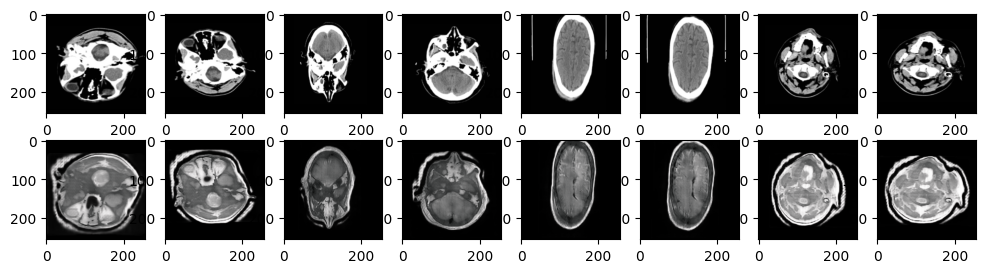

Target to Source Samples


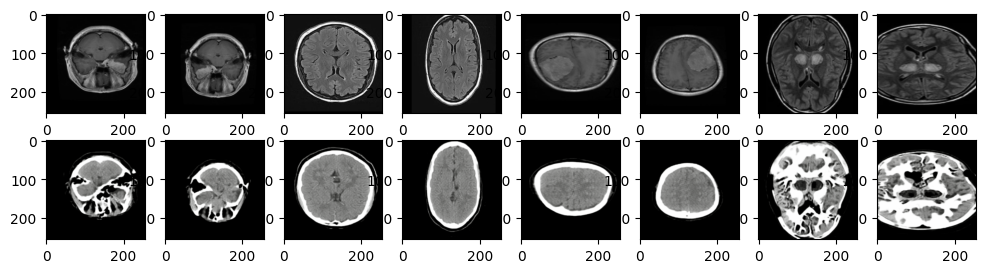

Epoch: 100/2401

source_discr: 0.13306933641433716, target_discr: 0.429648756980896 source_ADV: 0.6998449340462685, target_ADV: 0.8324001729488373 

recon_target_loss :0.024311859160661697, recon_source_loss: 0.04244648665189743 

Normal Log loss: 1.8388071656227112

Source to Target Samples


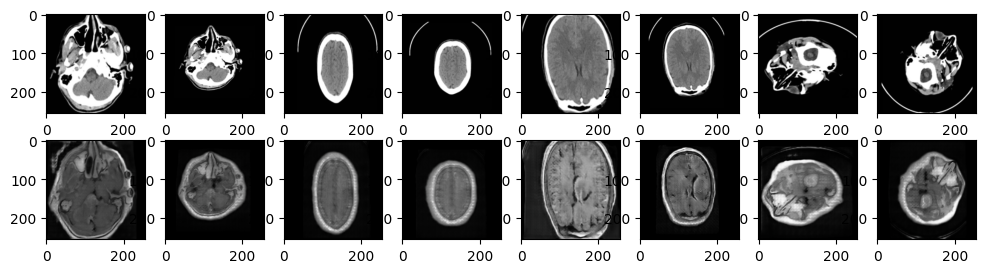

Target to Source Samples


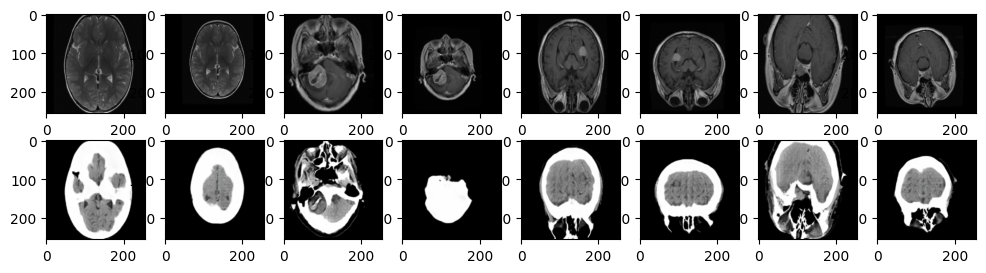

Epoch: 200/2401

source_discr: 0.20819443464279175, target_discr: 0.40639030933380127 source_ADV: 0.6438658311963081, target_ADV: 0.7765891253948212 

recon_target_loss :0.018053606152534485, recon_source_loss: 0.03811490163207054 

Normal Log loss: 1.8387368321418762

Source to Target Samples


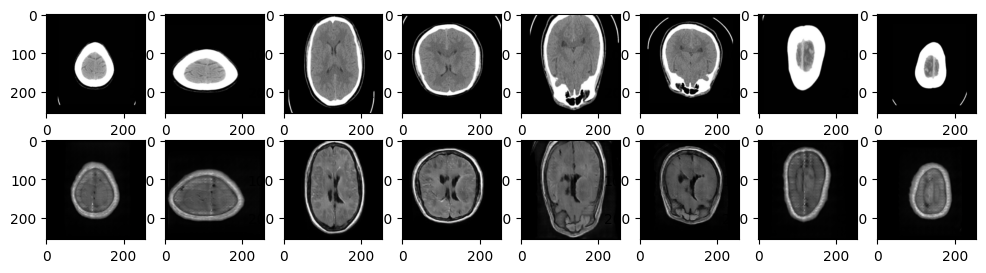

Target to Source Samples


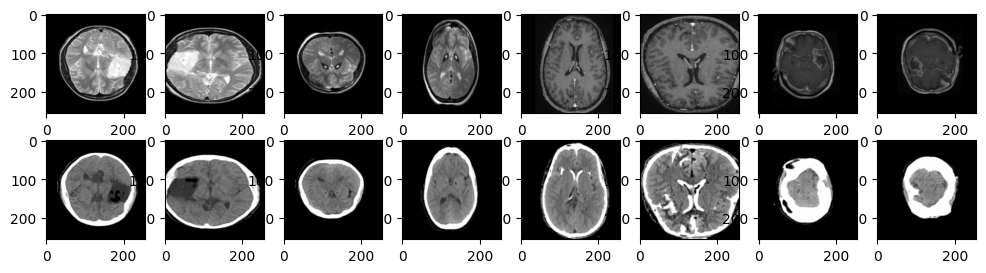

Epoch: 300/2401

source_discr: 0.07976130396127701, target_discr: 0.439492404460907 source_ADV: 0.7163998559117317, target_ADV: 0.877767875790596 

recon_target_loss :0.021130938082933426, recon_source_loss: 0.04457134008407593 

Normal Log loss: 1.8388566374778748

Source to Target Samples


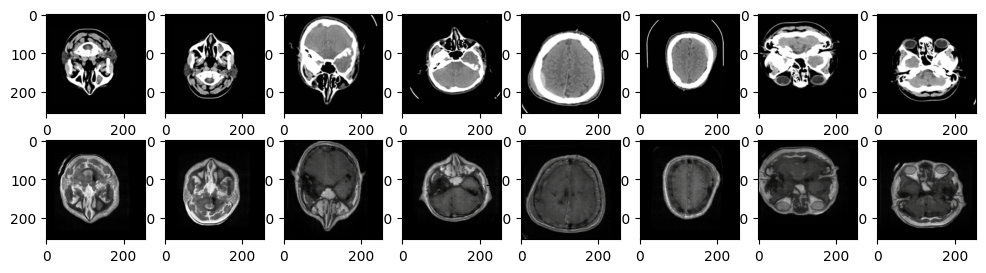

Target to Source Samples


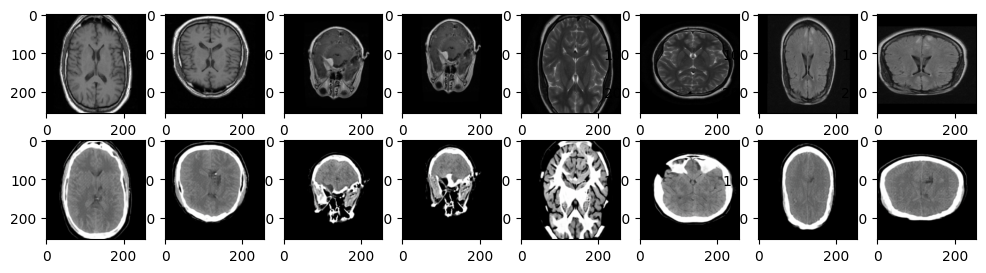

Epoch: 400/2401

source_discr: 0.2955814599990845, target_discr: 0.49632513523101807 source_ADV: 0.6732980161905289, target_ADV: 0.760281465947628 

recon_target_loss :0.024699771776795387, recon_source_loss: 0.04670237749814987 

Normal Log loss: 1.8389070630073547

Source to Target Samples


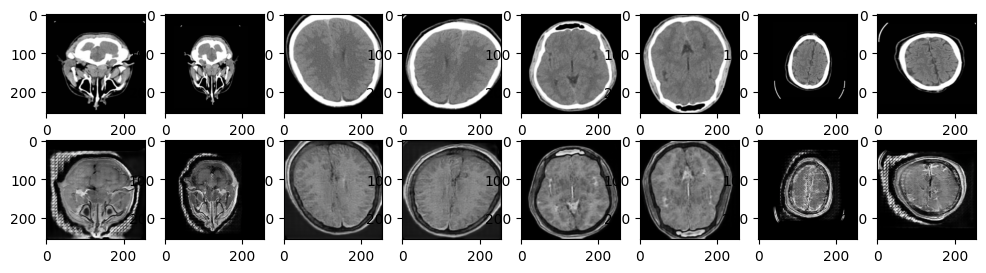

Target to Source Samples


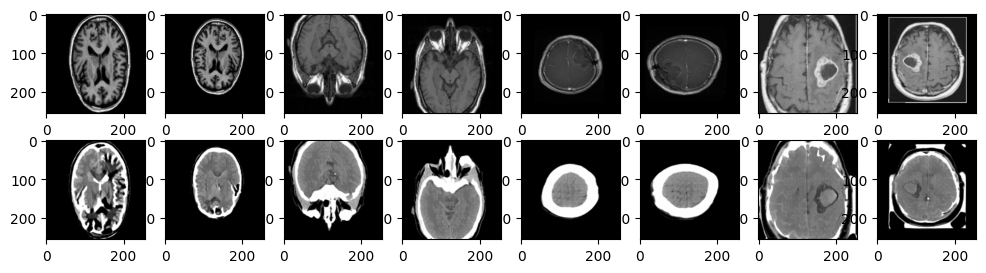

Epoch: 500/2401

source_discr: 0.27898111939430237, target_discr: 0.35758501291275024 source_ADV: 0.7987766861915588, target_ADV: 0.8065074235200882 

recon_target_loss :0.018818529322743416, recon_source_loss: 0.06229403614997864 

Normal Log loss: 1.8390623331069946

Source to Target Samples


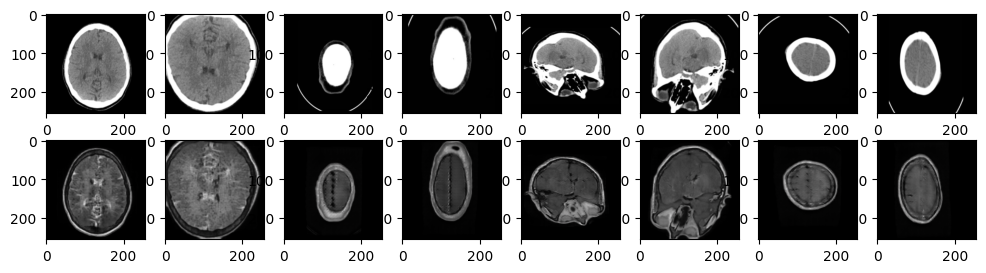

Target to Source Samples


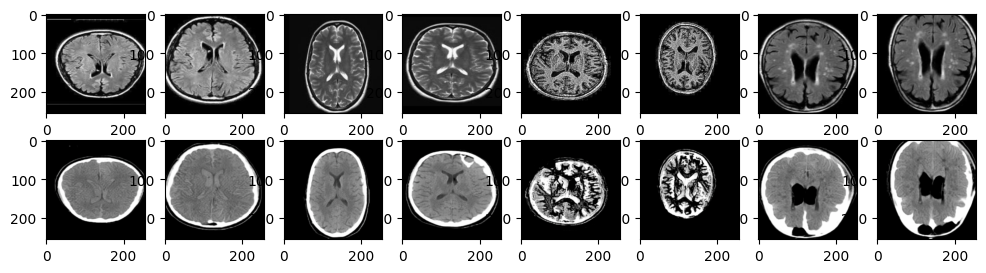

Epoch: 600/2401

source_discr: 0.13161271810531616, target_discr: 0.40290433168411255 source_ADV: 0.799686536192894, target_ADV: 0.8438286781311035 

recon_target_loss :0.02155425399541855, recon_source_loss: 0.06089738756418228 

Normal Log loss: 1.8388803601264954

Source to Target Samples


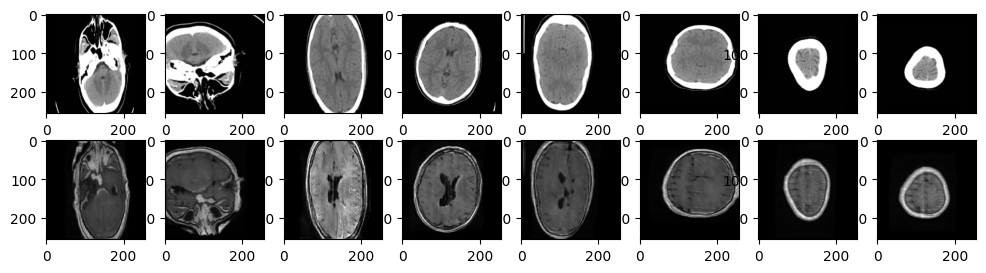

Target to Source Samples


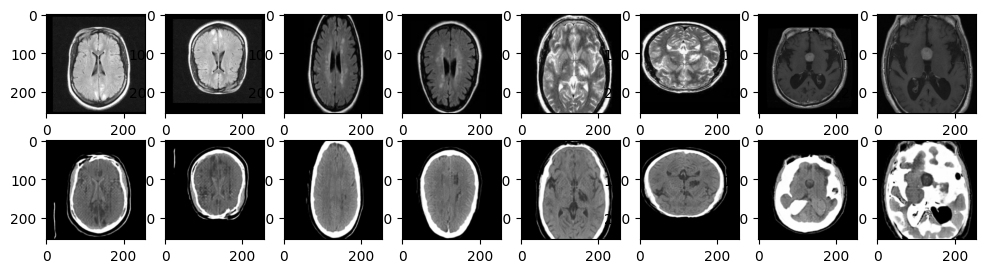

Epoch: 700/2401

source_discr: 0.2767946124076843, target_discr: 0.38980498909950256 source_ADV: 0.8346674591302872, target_ADV: 0.7692680060863495 

recon_target_loss :0.03306527063250542, recon_source_loss: 0.0667182207107544 

Normal Log loss: 1.839070200920105

Source to Target Samples


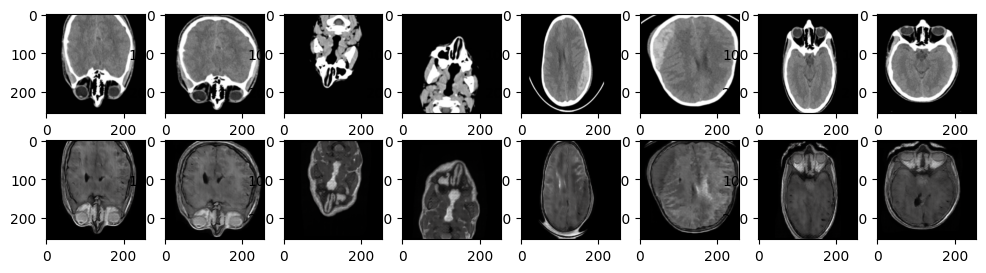

Target to Source Samples


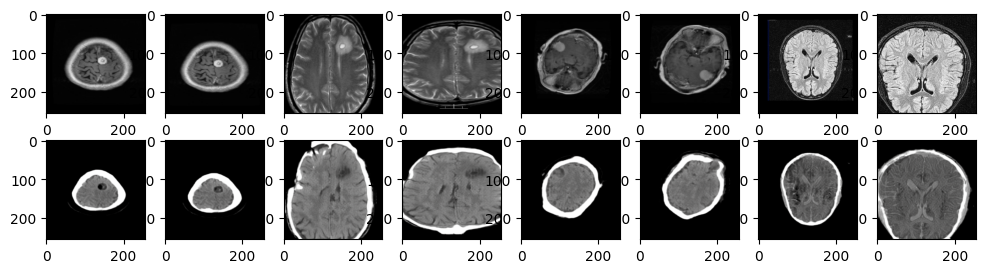

Epoch: 800/2401

source_discr: 0.28356170654296875, target_discr: 0.374509334564209 source_ADV: 0.9099399745464325, target_ADV: 0.7467066198587418 

recon_target_loss :0.020818594843149185, recon_source_loss: 0.04480939731001854 

Normal Log loss: 1.8389390110969543

Source to Target Samples


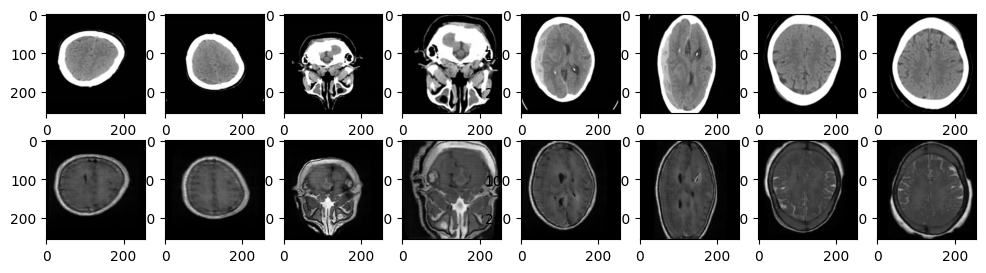

Target to Source Samples


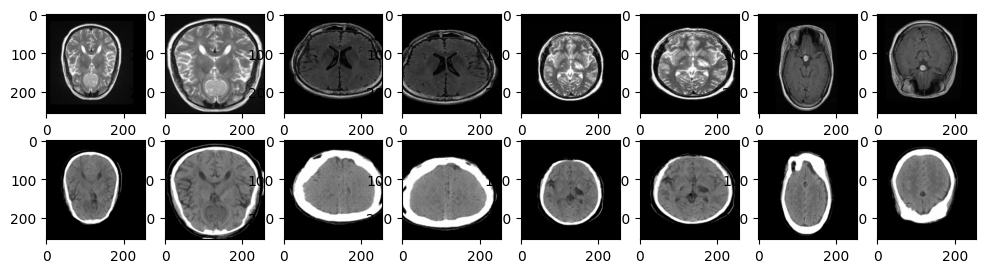

Epoch: 900/2401

source_discr: 0.11173319816589355, target_discr: 0.37213313579559326 source_ADV: 0.7130049765110016, target_ADV: 0.8476927727460861 

recon_target_loss :0.019425541162490845, recon_source_loss: 0.03648441657423973 

Normal Log loss: 1.8388164639472961

Source to Target Samples


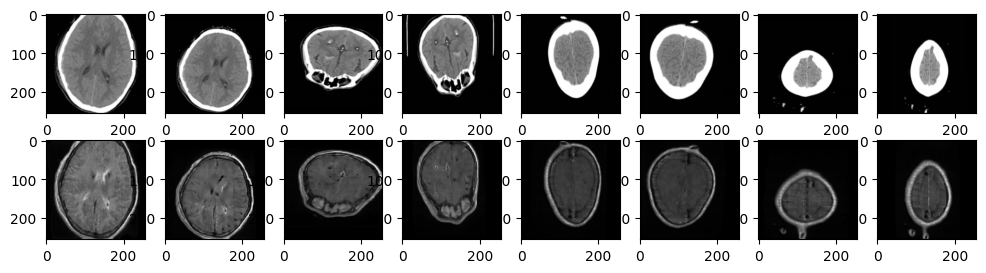

Target to Source Samples


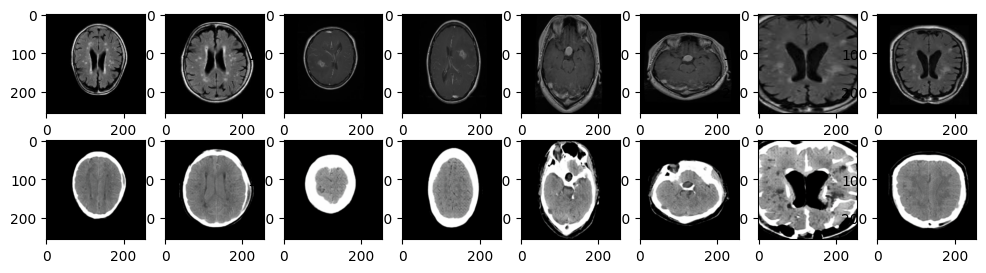

Epoch: 1000/2401

source_discr: 0.4592736065387726, target_discr: 0.7065315246582031 source_ADV: 0.6764556840062141, target_ADV: 0.7151809483766556 

recon_target_loss :0.019780272617936134, recon_source_loss: 0.053119536489248276 

Normal Log loss: 1.838862955570221

Source to Target Samples


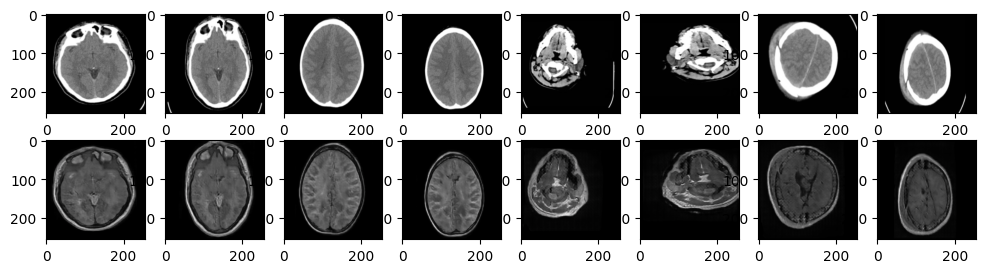

Target to Source Samples


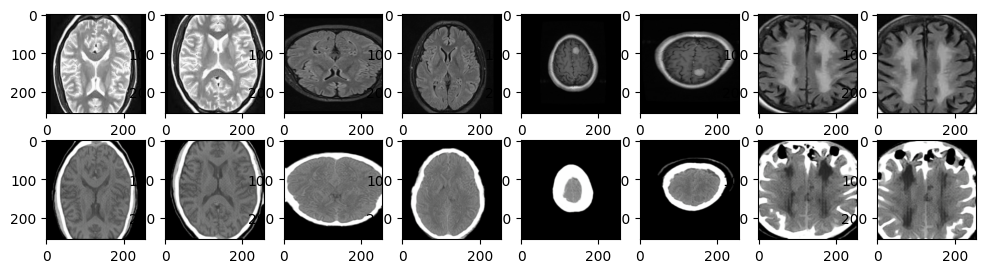

Epoch: 1100/2401

source_discr: 0.2912293076515198, target_discr: 0.37869709730148315 source_ADV: 0.7056964486837387, target_ADV: 0.7823515981435776 

recon_target_loss :0.023378364741802216, recon_source_loss: 0.03912921994924545 

Normal Log loss: 1.838837742805481

Source to Target Samples


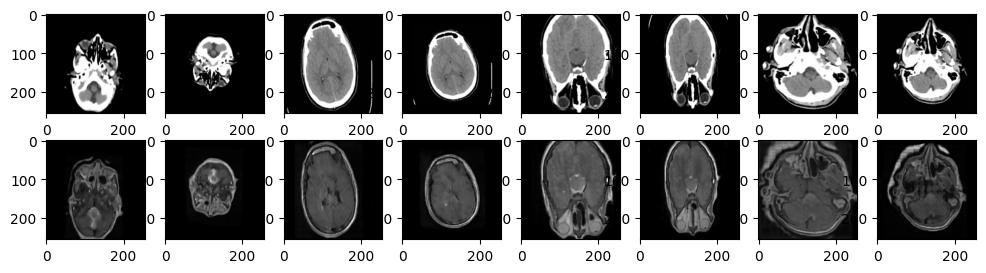

Target to Source Samples


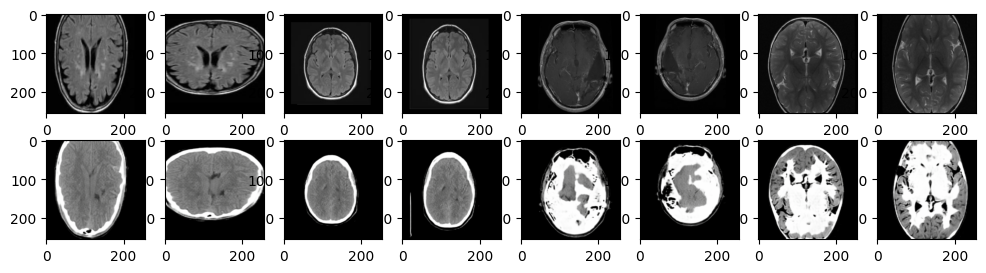

Epoch: 1200/2401

source_discr: 0.5553011894226074, target_discr: 0.7829960584640503 source_ADV: 0.873899981379509, target_ADV: 0.5649981126189232 

recon_target_loss :0.01876087859272957, recon_source_loss: 0.047656238079071045 

Normal Log loss: 1.8387894034385681

Source to Target Samples


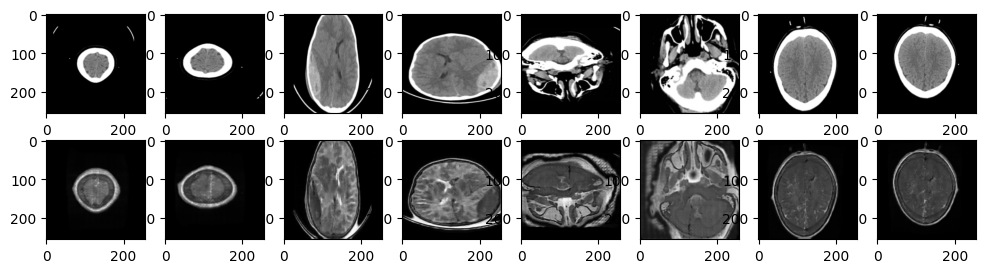

Target to Source Samples


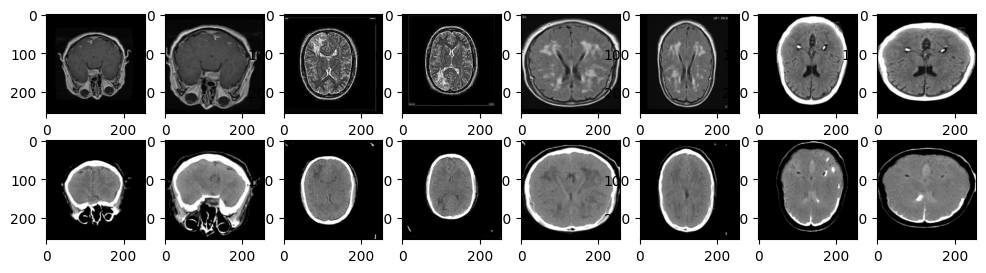

Epoch: 1300/2401

source_discr: 0.20227482914924622, target_discr: 0.5804476141929626 source_ADV: 0.6438992694020271, target_ADV: 0.8022779673337936 

recon_target_loss :0.021068021655082703, recon_source_loss: 0.04296215996146202 

Normal Log loss: 1.839085876941681

Source to Target Samples


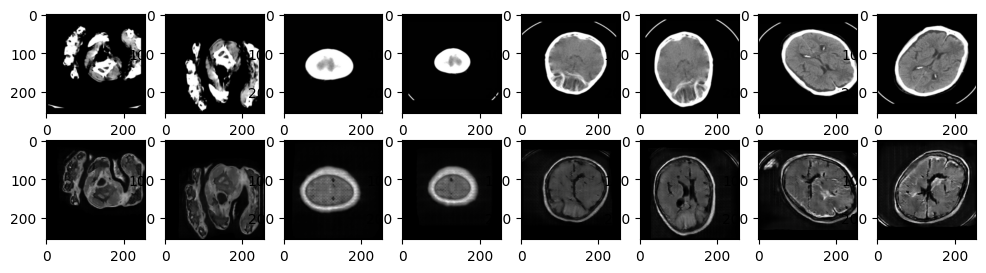

Target to Source Samples


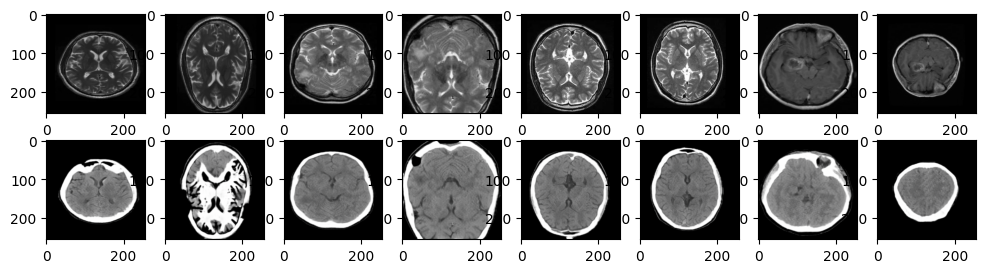

Epoch: 1400/2401

source_discr: 0.35800206661224365, target_discr: 0.42009079456329346 source_ADV: 0.6236583963036537, target_ADV: 0.8459183275699615 

recon_target_loss :0.028052888810634613, recon_source_loss: 0.0648593083024025 

Normal Log loss: 1.8387046456336975

Source to Target Samples


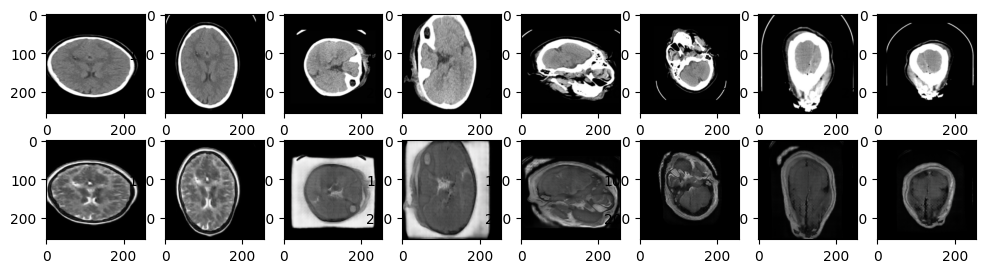

Target to Source Samples


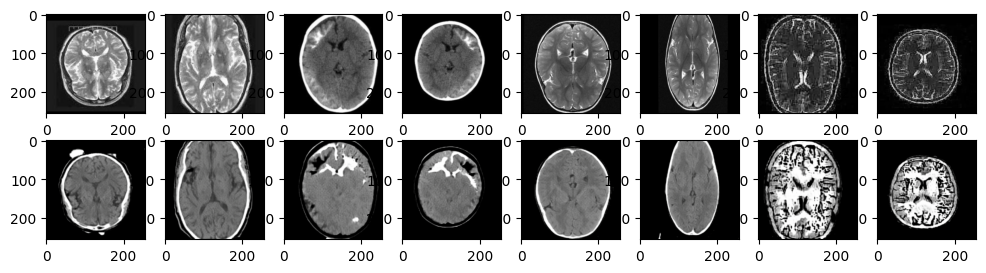

Epoch: 1500/2401

source_discr: 0.15147531032562256, target_discr: 0.2995351552963257 source_ADV: 0.8542999178171158, target_ADV: 0.842877671122551 

recon_target_loss :0.02793353796005249, recon_source_loss: 0.05380507558584213 

Normal Log loss: 1.838756501674652

Source to Target Samples


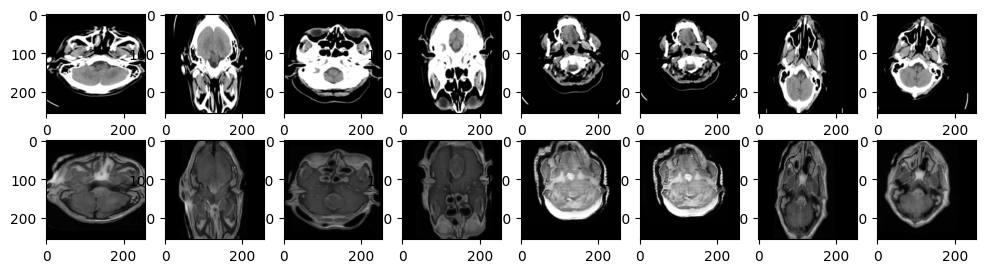

Target to Source Samples


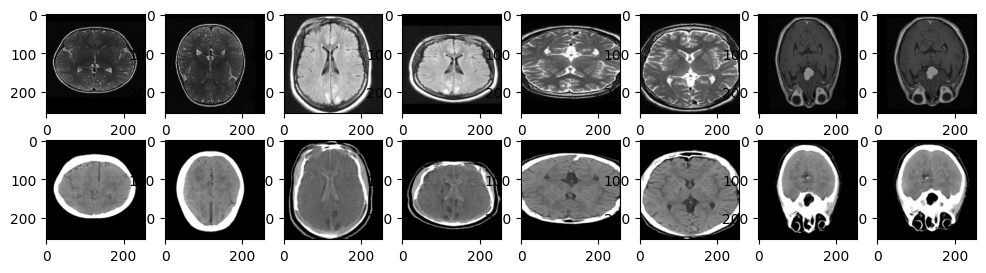

Epoch: 1600/2401

source_discr: 0.5425125360488892, target_discr: 0.8251893520355225 source_ADV: 0.5015724822878838, target_ADV: 0.6832983493804932 

recon_target_loss :0.029896341264247894, recon_source_loss: 0.05191656947135925 

Normal Log loss: 1.838811218738556

Source to Target Samples


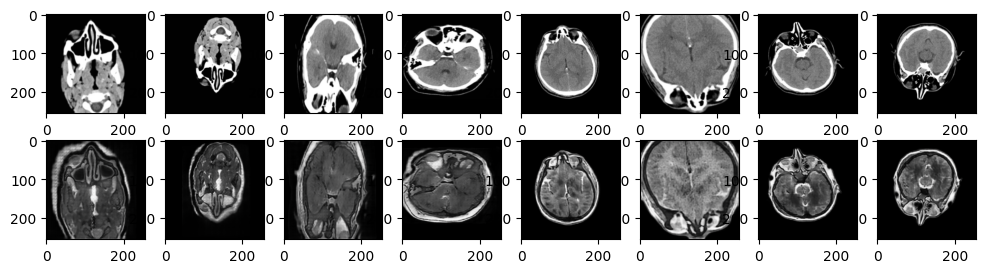

Target to Source Samples


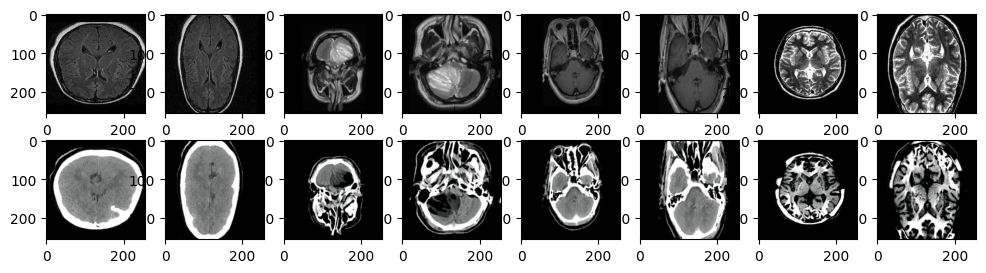

Epoch: 1700/2401

source_discr: 0.11560913175344467, target_discr: 0.2805599570274353 source_ADV: 0.7634355053305626, target_ADV: 0.8535671085119247 

recon_target_loss :0.022608403116464615, recon_source_loss: 0.056879669427871704 

Normal Log loss: 1.8388124704360962

Source to Target Samples


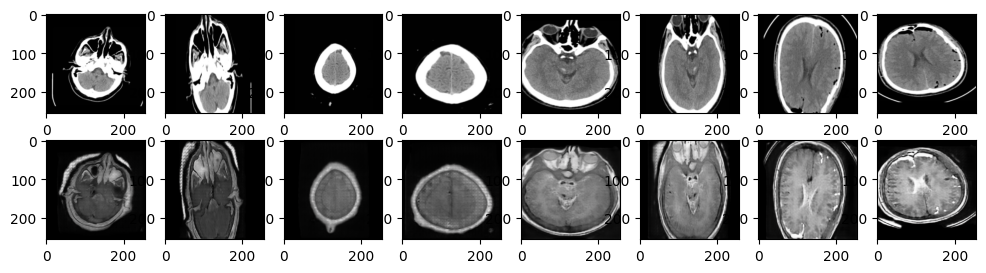

Target to Source Samples


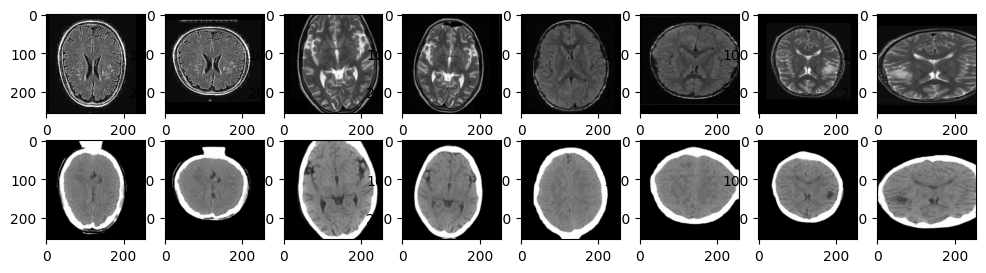

Epoch: 1800/2401

source_discr: 0.12753136456012726, target_discr: 0.3962889313697815 source_ADV: 0.5929417088627815, target_ADV: 0.8657002747058868 

recon_target_loss :0.021832861006259918, recon_source_loss: 0.039462000131607056 

Normal Log loss: 1.838959813117981

Source to Target Samples


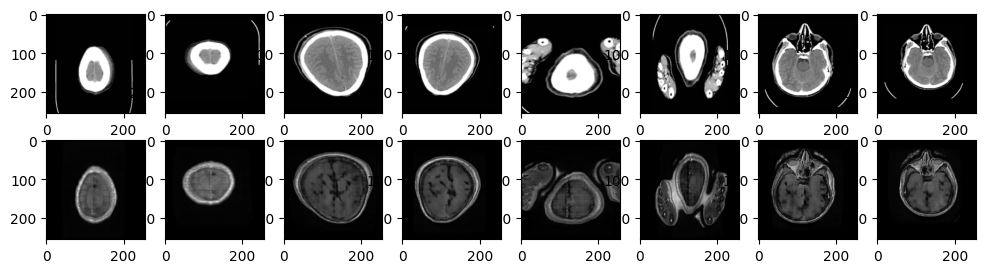

Target to Source Samples


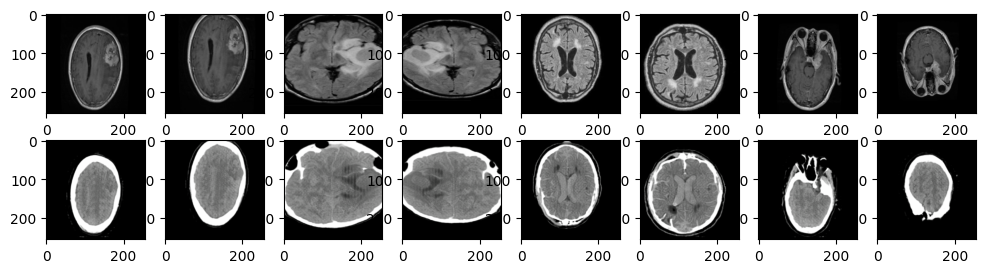

Epoch: 1900/2401

source_discr: 0.19544845819473267, target_discr: 0.4112921357154846 source_ADV: 0.8839686214923859, target_ADV: 0.8208362013101578 

recon_target_loss :0.028961051255464554, recon_source_loss: 0.0512780137360096 

Normal Log loss: 1.838783323764801

Source to Target Samples


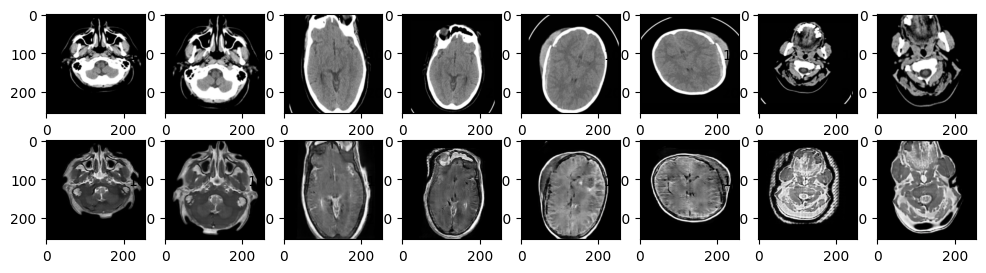

Target to Source Samples


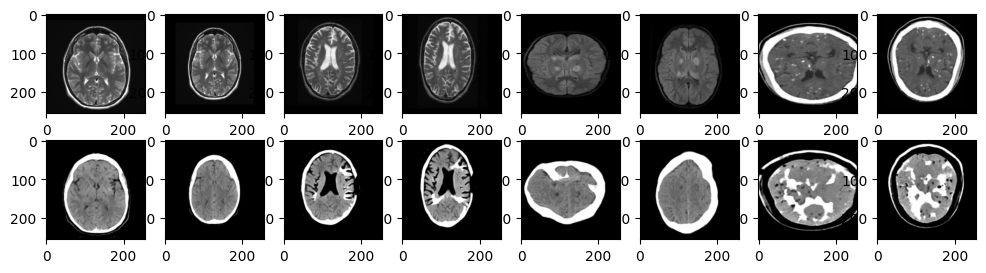

Epoch: 2000/2401

source_discr: 0.33459725975990295, target_discr: 0.43627414107322693 source_ADV: 0.6858924776315689, target_ADV: 0.7638968378305435 

recon_target_loss :0.024727534502744675, recon_source_loss: 0.04528740793466568 

Normal Log loss: 1.838898777961731

Source to Target Samples


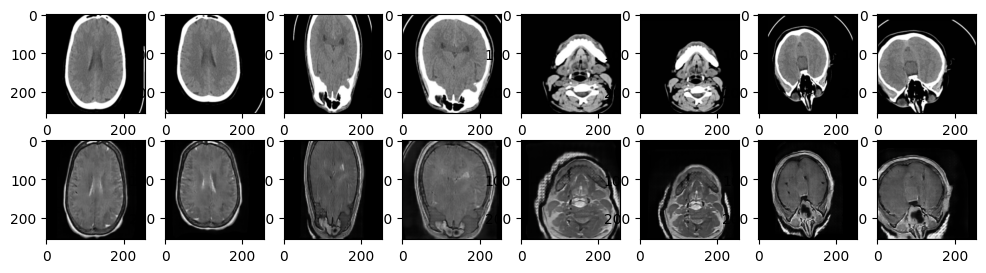

Target to Source Samples


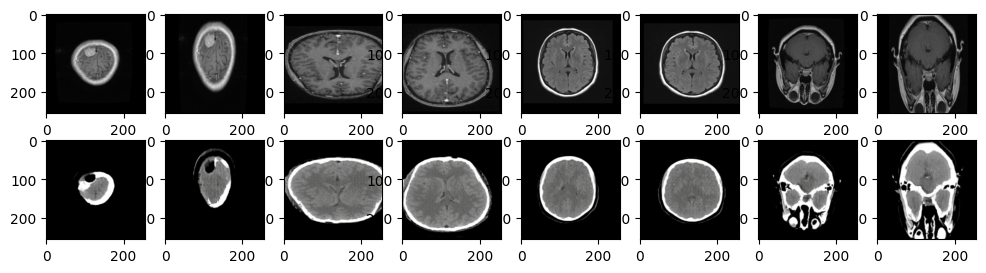

Epoch: 2100/2401

source_discr: 0.3138080835342407, target_discr: 0.39567142724990845 source_ADV: 0.7643942758440971, target_ADV: 0.7774144560098648 

recon_target_loss :0.02243112027645111, recon_source_loss: 0.0516551174223423 

Normal Log loss: 1.8388096690177917

Source to Target Samples


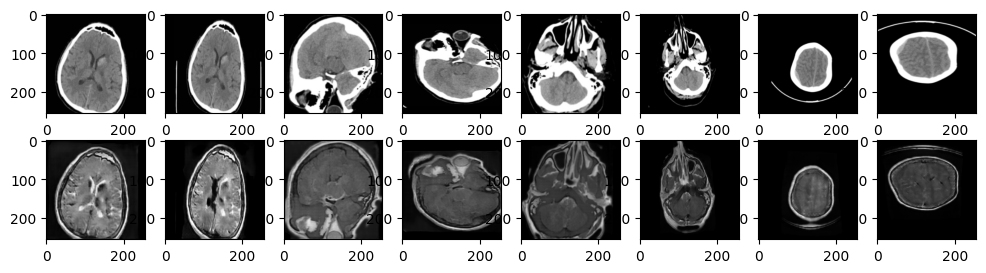

Target to Source Samples


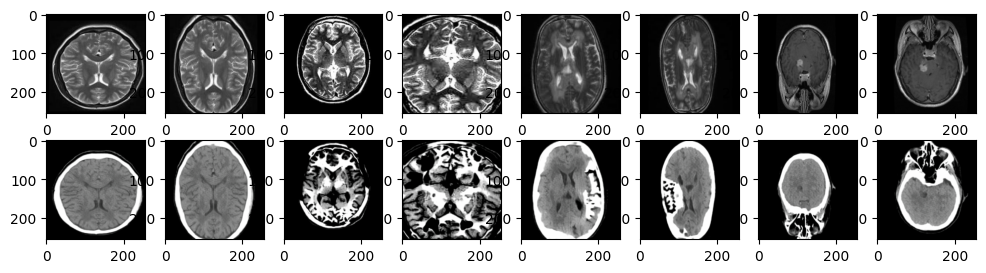

Epoch: 2200/2401

source_discr: 0.2059793621301651, target_discr: 0.34690409898757935 source_ADV: 0.9090660214424133, target_ADV: 0.7928918749094009 

recon_target_loss :0.019203992560505867, recon_source_loss: 0.04335058480501175 

Normal Log loss: 1.8387293219566345

Source to Target Samples


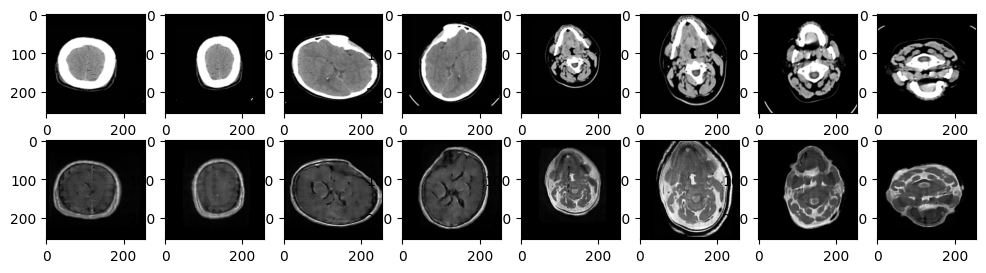

Target to Source Samples


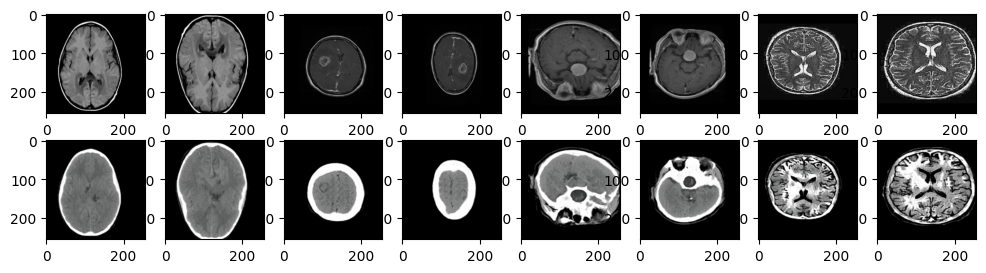

Epoch: 2300/2401

source_discr: 0.10053551197052002, target_discr: 0.22764138877391815 source_ADV: 0.8624645173549652, target_ADV: 0.8788560181856155 

recon_target_loss :0.020030410960316658, recon_source_loss: 0.060564279556274414 

Normal Log loss: 1.8388909697532654

Source to Target Samples


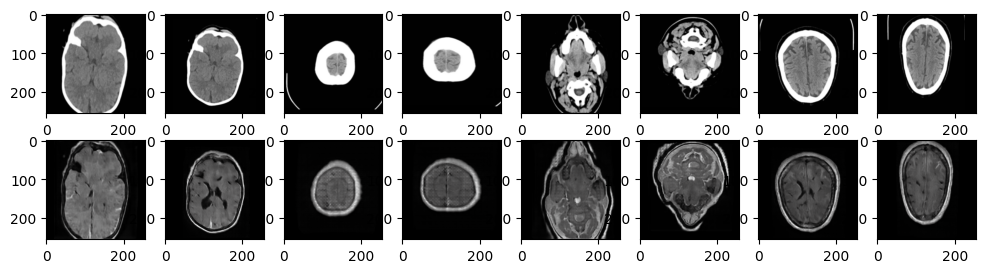

Target to Source Samples


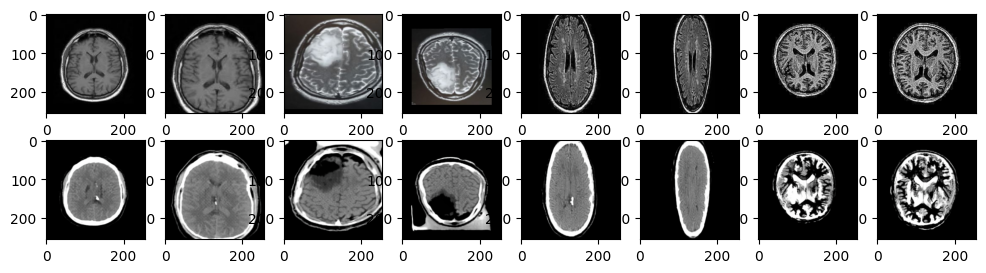

Epoch: 2400/2401

source_discr: 0.16325438022613525, target_discr: 0.2218436300754547 source_ADV: 0.9168777614831924, target_ADV: 0.8603700995445251 

recon_target_loss :0.019885940477252007, recon_source_loss: 0.050931304693222046 

Normal Log loss: 1.8390640616416931

Source to Target Samples


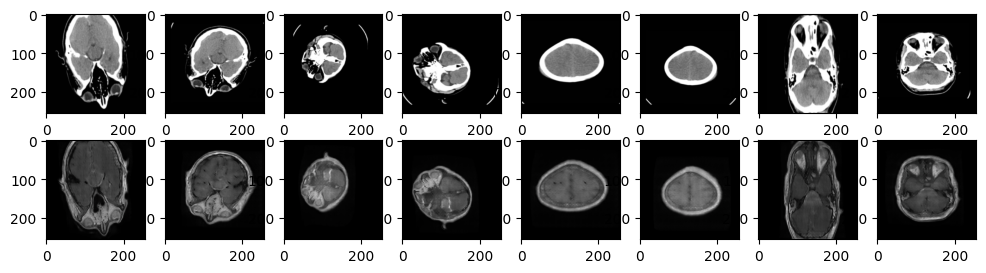

Target to Source Samples


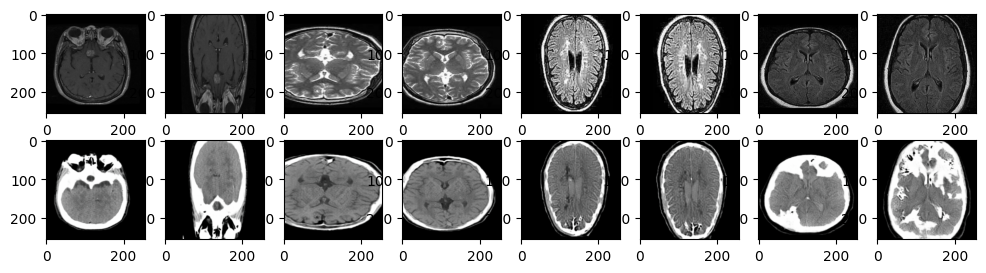

In [23]:
epochs = 2401
batch_size = 4
batch_after_augmentation = batch_size*2
patchGan = (batch_after_augmentation, 2, 2, 1)
patchGan1 = (batch_after_augmentation, 8, 8, 1)
patchGan2 = (batch_after_augmentation, 16, 16, 1)
patchGan3 = (batch_after_augmentation, 32, 32, 1)
for i in range(epochs):
    indexs = np.random.randint(1740, size = (batch_size,))
    source_images = data_augmentation(read_images(source_pathes[indexs]))
    target_images = data_augmentation(read_images(target_pathes[indexs]))
    real_source = source_images
    real_target = target_images
    fake_source = g_source.predict(real_target, verbose = 0)
    fake_target = g_target.predict(real_source, verbose = 0)
    allImagesSource = np.vstack([real_source, fake_source])
    allImagesTarget = np.vstack([real_target, fake_target])
    all_d_source, d1, d2, d3, d4  = d_source.train_on_batch(allImagesSource, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_d_target, dt1, dt2, dt3, dt4  = d_target.train_on_batch(allImagesTarget, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_loss, loss_1_1, loss_1_2, loss_1_3, loss_1_4, loss_2_1, loss_2_2, loss_2_3, loss_2_4, loss_3, loss_4, nloss1, nloss2 = gan.train_on_batch([real_source, real_target],
                                                       [[ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       [ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       real_source,
                                                       real_target,
                                                       get_normal_samples(batch_after_augmentation),
                                                       get_normal_samples(batch_after_augmentation)])
    if i%200 == 0:
        save_weight(g_target, g_source, d_source, d_target)
    if i%100 == 0:
        print('Epoch: {}/{}'.format(i, epochs))
        str_ = 'source_discr: {}, target_discr: {}'.format(all_d_source, all_d_target)
        str_2 = 'source_ADV: {}, target_ADV: {}'.format((loss_1_1 + loss_1_2 + loss_1_3 + loss_1_4)/4,
                                                            (loss_2_1 + loss_2_2 + loss_2_3 + loss_2_4)/4)
        str_3 = 'recon_target_loss :{}, recon_source_loss: {}'.format(loss_3, loss_4)
        print(str_ + ' ' +str_2 + ' ')
        print(str_3 + ' ')
        print('Normal Log loss: {}'.format((nloss1 + nloss2)))
        print('Source to Target Samples')
        samples(g_target, real_source)
        print('Target to Source Samples')
        samples(g_source, real_target)

In [24]:
save_weight(g_target, g_source, d_source, d_target)

In [25]:
def draw_compare(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 16))
  index = 0
  n = 0
  for i in range(36):
    plt.subplot(6, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

In [26]:
def generator_samples(pathes_, m, type_):
  indexs = np.random.randint(1700, size = (18,))
  images = read_images(pathes_[indexs])
  draw_compare(np.squeeze(m.predict(images, verbose = 0)), images, type_)

# Results:
The model has been tested in generating a number of CT scan images from MRI images, and vice versa, and the results are shown in the samples that we showed.

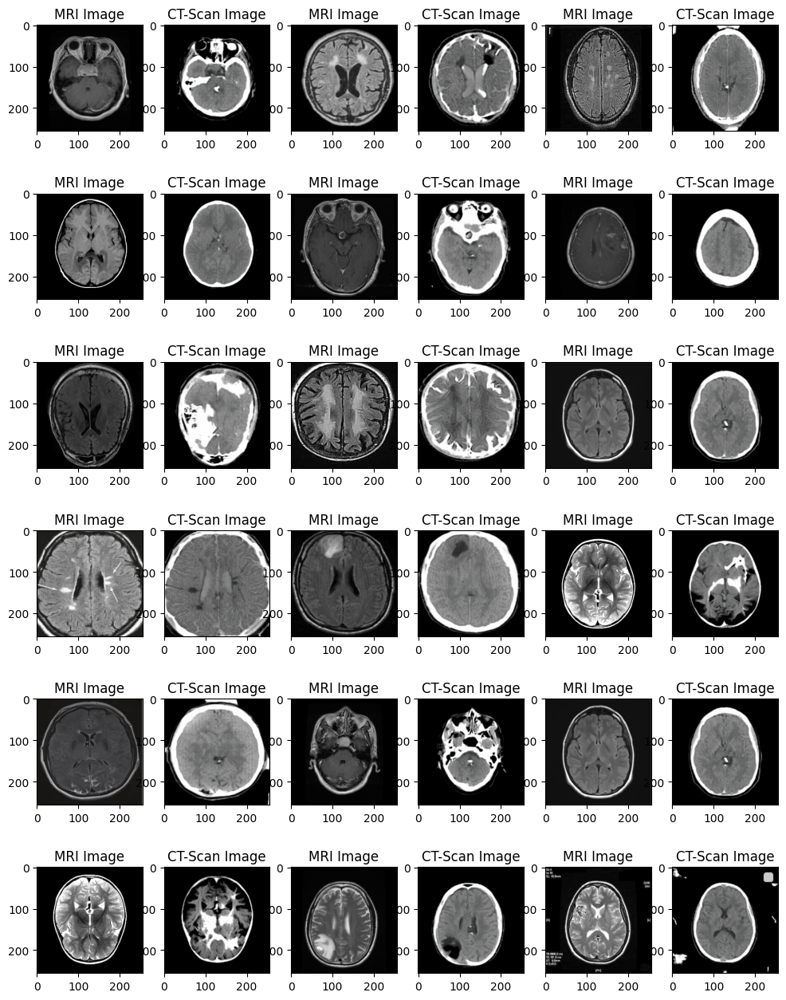

In [27]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

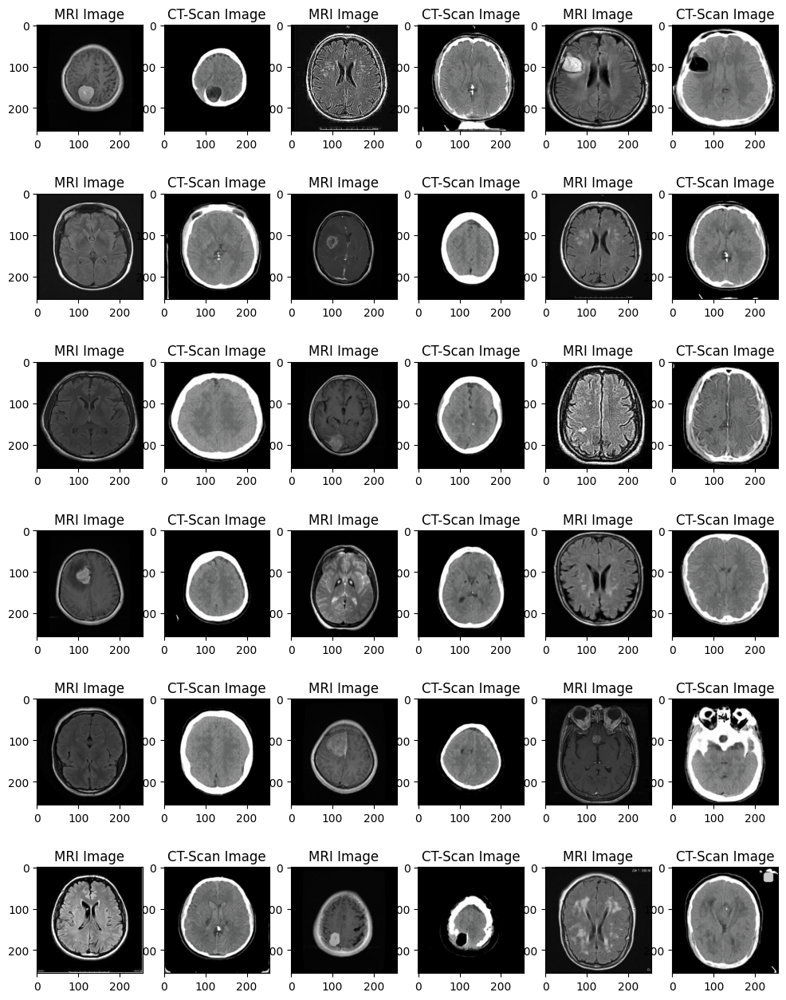

In [28]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

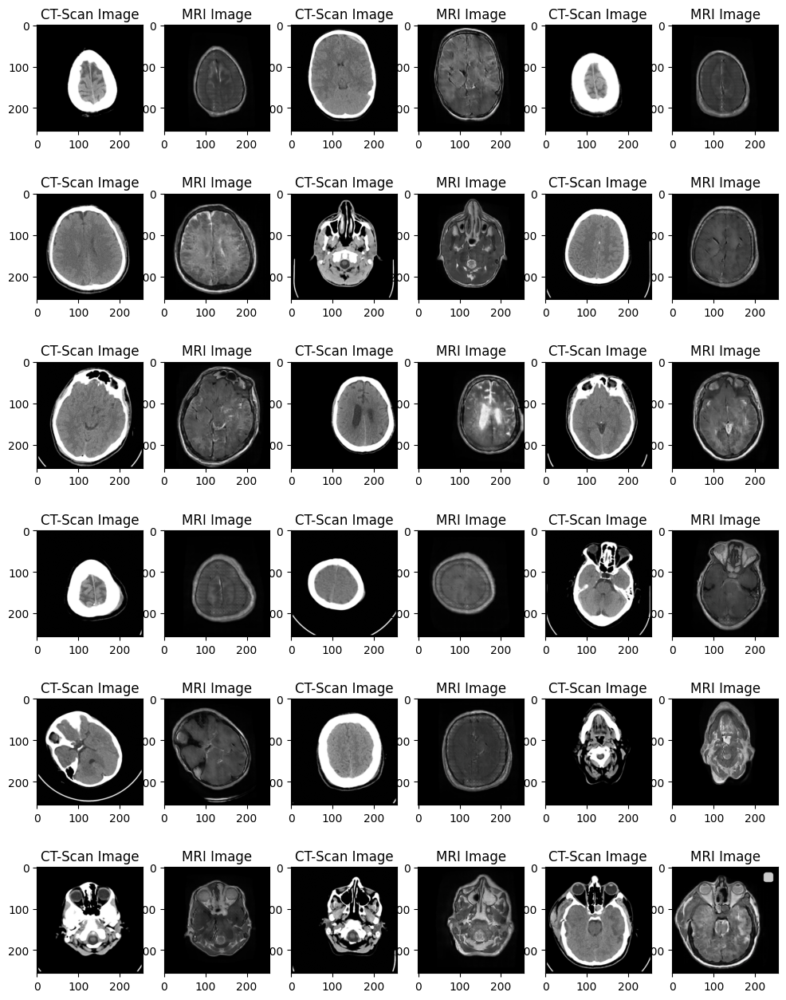

In [29]:
generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

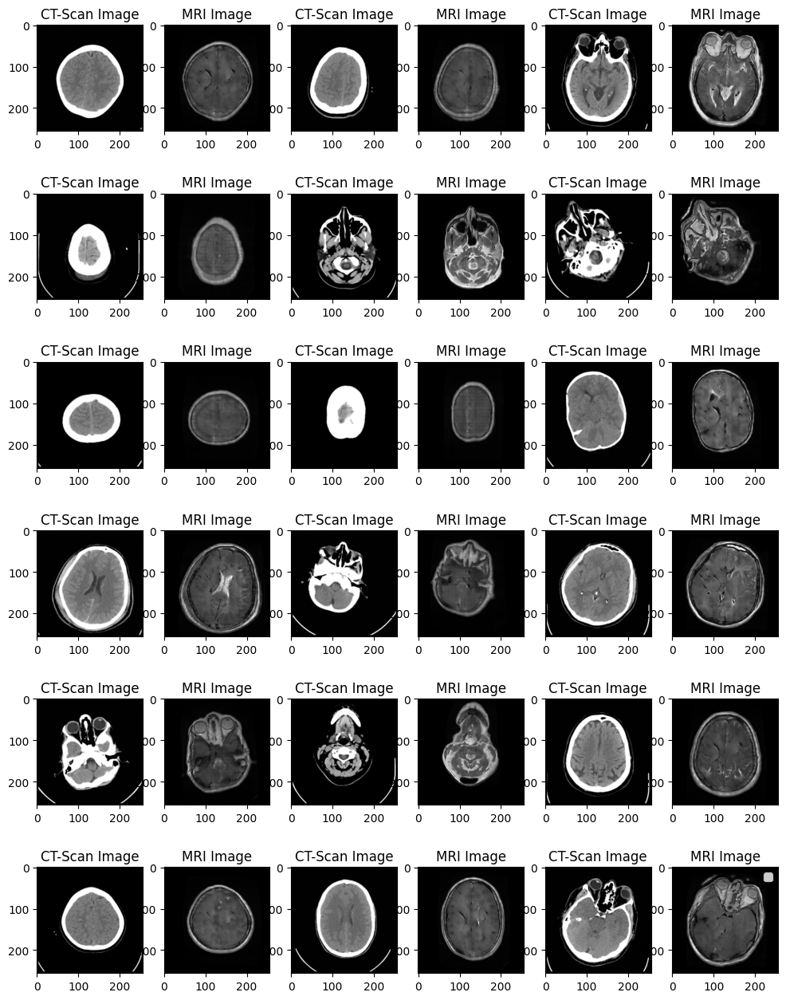

In [30]:
generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

# Test Generation:

- In order to use a more reliable methodology in evaluating the performance of the model that I trained, I used images that the model did not see during training, and for each image I did the following:
# The Fisrt Case:
- I have CT images that I converted into an MRI, then I recovered the CT image from the MRI images, and then I studied the difference between the basic CT images and the CT images that were retrieved from the MRI that was generated from the CT images.
- We note here that the loss is small for the CT images, and this indicates that the trained model was able to study the correspondence of the two probability distributions for each type.
# The second case:
- Moving from MRI images to CT images and then restoring the MRI from the CT images. Thus, we notice that the loss here is greater when comparing the original MRI images to the generated images, due to the small number of samples included in the dataset.

# Conclusion
- This measure is considered acceptable for studying the success of the obstetrics process, but it is not a source of trust for me yet, because the number of samples is small, and therefore in this case the proposed model is forced to study the convergence between the two probability distributions (CT images and MRI images), and therefore in this case, given the lack of samples and the damage The model is to reduce the value of the loss in each round. Some cases may be incorrect during the projection process, but since the samples are small, the result is considered acceptable.

In [31]:
def draw_samples(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 9))
  index = 0
  n = 0
  for i in range(24):
    plt.subplot(4, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

In [32]:
ct_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/unseen_demo_images/ct').glob('*.*'))))
mri_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/unseen_demo_images/mri').glob('*.*'))))

In [33]:
ctImagesGeneration = g_source.predict(g_target.predict(read_images(ct_pathes)))
ctImagesGeneration.shape

1/1 [==============================] - 3s 3s/step

1/1 [==============================] - 0s 141ms/step


(15, 256, 256, 3)

In [34]:
ctOrginalImages = read_images(ct_pathes)
ctOrginalImages.shape

(15, 256, 256, 3)

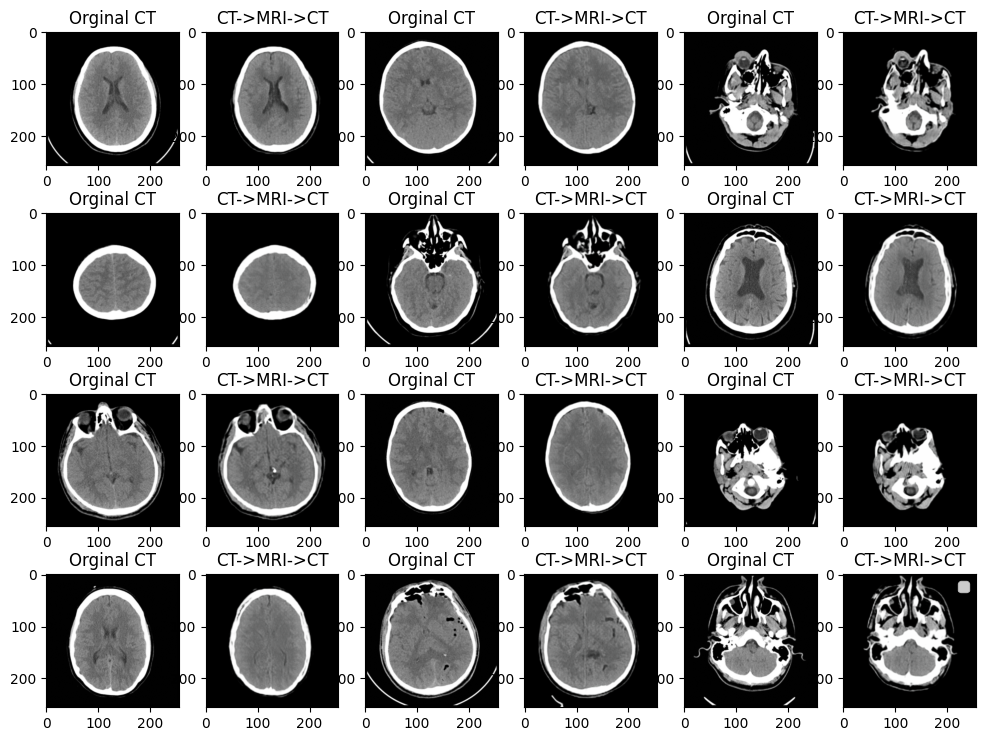

In [35]:
draw_samples(ctImagesGeneration, ctOrginalImages, ['Orginal CT', 'CT->MRI->CT'])

In [36]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(ctOrginalImages),
                                                 tf.keras.layers.Flatten()(ctImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.2691099>

In [37]:
mriImagesGeneration = g_target.predict(g_source.predict(read_images(mri_pathes)))
mriImagesGeneration.shape

1/1 [==============================] - 0s 132ms/step

1/1 [==============================] - 0s 106ms/step


(15, 256, 256, 3)

In [38]:
mriOrginalImages = read_images(mri_pathes)
mriOrginalImages.shape

(15, 256, 256, 3)

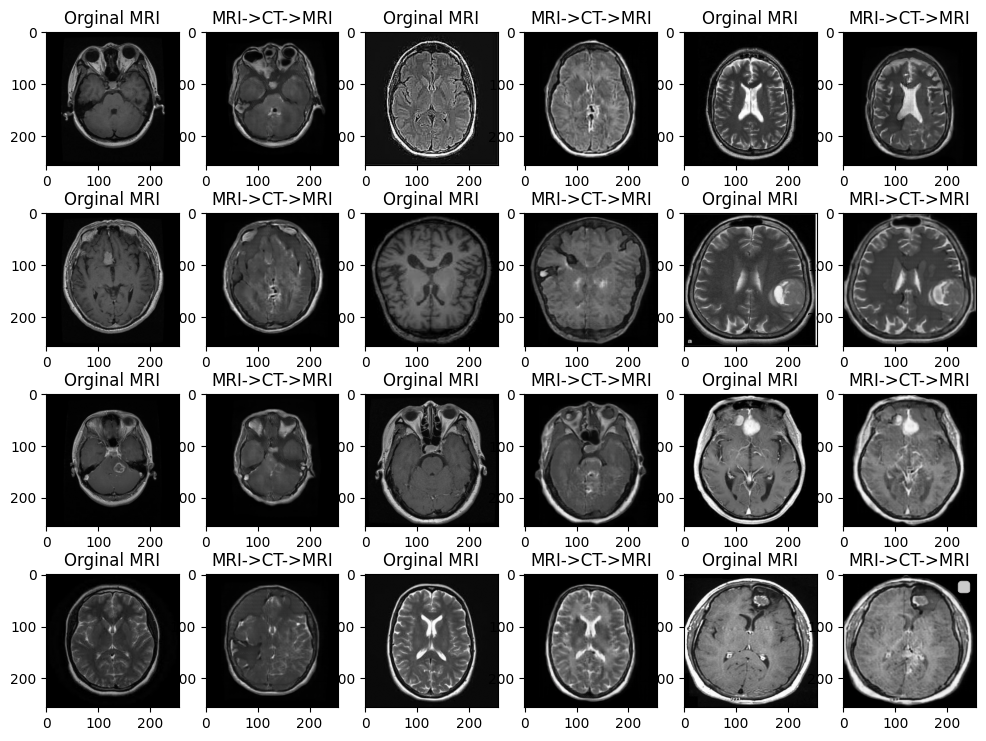

In [39]:
draw_samples(mriImagesGeneration, mriOrginalImages, ['Orginal MRI', 'MRI->CT->MRI'])

In [40]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(mriOrginalImages),
                                                 tf.keras.layers.Flatten()(mriImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.40904203>